# Analyze and Prepare the Adult Dataset

This notebook is based on [this](https://www.manning.com/liveproject/data-preprocessing) course. It contains a few parts of code given by authors in partial solution file. 

<b> 1. Use the "adult.data" file from the UCI repository. You can learn more about the dataset from "adult.names" file also available from the UCI data repository. You should download the file from the internet using Julia. (Make sure to download it only if it is not already present in the local folder). For this dataset, notice that there is also an "adult.test" file in the repository. A train/test data split was already done for us, and we should keep that in mind during the modeling process. In this notebook, we will work with the training data only.</b>

In [1]:
using HTTP
using SHA
using DataFrames
using CSV
using Plots
using Chain
using Arrow

In [2]:
isfile("adult.data")||HTTP.download("https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data","adult.data");
isfile("adult.names")||HTTP.download("https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.names","adult.names");

<b>2. Check that the file has been fetched correctly by calculating its SHA1 hash, and compare it to the following reference value:

[0xee, 0x86, 0xbb, 0xe5, 0x56,
 0x57, 0x8f, 0x70, 0x9a, 0xe0,
 0xfd, 0x00, 0x2a, 0xc5, 0x8a,
 0xc9, 0x37, 0x26, 0x48, 0x2f]</b>

In [3]:
adult_sha1= open("adult.data") do f
    sha1(f)
    end;

In [4]:
check=[0xee, 0x86, 0xbb, 0xe5, 0x56,
 0x57, 0x8f, 0x70, 0x9a, 0xe0,
 0xfd, 0x00, 0x2a, 0xc5, 0x8a,
 0xc9, 0x37, 0x26, 0x48, 0x2f];

In [5]:
adult_sha1==check

true

In [6]:
println(String(read("adult.names")))

| This data was extracted from the census bureau database found at
| http://www.census.gov/ftp/pub/DES/www/welcome.html
| Donor: Ronny Kohavi and Barry Becker,
|        Data Mining and Visualization
|        Silicon Graphics.
|        e-mail: ronnyk@sgi.com for questions.
| Split into train-test using MLC++ GenCVFiles (2/3, 1/3 random).
| 48842 instances, mix of continuous and discrete    (train=32561, test=16281)
| 45222 if instances with unknown values are removed (train=30162, test=15060)
| Duplicate or conflicting instances : 6
| Class probabilities for adult.all file
| Probability for the label '>50K'  : 23.93% / 24.78% (without unknowns)
| Probability for the label '<=50K' : 76.07% / 75.22% (without unknowns)
|
| Extraction was done by Barry Becker from the 1994 Census database.  A set of
|   reasonably clean records was extracted using the following conditions:
|   ((AAGE>16) && (AGI>100) && (AFNLWGT>1)&& (HRSWK>0))
|
| Prediction task is to determine whether a person makes over

<b>3. Load the data into Juliaâ€™s DataFrame. Note that missing values are denoted by ? in the CSV files.</b>

In [7]:
df = CSV.read("adult.data",DataFrame,
    header=[:age,:workclass,:fnlwgt,:education,:education_num,:maritial_status, :occupation,:relationship,:race,:sex,:capital_gain,:capital_loss,:hours_per_week,:native_country,:target], ntasks=1);

<b>4. Adjust the number of columns printed by Jupyter Notebook to 200 and the number of rows to 20. This is an often needed quality of life adjustment that will allow you to display tabular data in friendlier way. </b>

In [8]:
ENV["LINES"] = 20;
ENV["COLUMNS"] = 200;

<b> 5.Drop the :fnlwgt variable from the analysis, as we will not use this technical column during prediction on our database.</b>

In [9]:
select!(df,Not(:fnlwgt));

<b>6. Examine the basic descriptive statistics of the training dataset using the describe function. We plan to use tree-based models capable of handling missing values, so we can leave this data as-is. Missing values are often either imputed or removed from the dataset, but it’s important to think holistically about the modeling process and take further steps into account.</b>

In [10]:
describe(df)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,age,38.5816,17,37.0,90,0,Int64
2,workclass,,?,,Without-pay,0,String31
3,education,,10th,,Some-college,0,String15
4,education_num,10.0807,1,10.0,16,0,Int64
5,maritial_status,,Divorced,,Widowed,0,String31
6,occupation,,?,,Transport-moving,0,String31
7,relationship,,Husband,,Wife,0,String15
8,race,,Amer-Indian-Eskimo,,White,0,String31
9,sex,,Female,,Male,0,String7


<b> 7. Get a list of qualitative (categorical) variables in this dataset. They are represented by string values.</br>

In [11]:
nominal=names(df,Union{AbstractString, Missing});

<b> 8. Explore the size of each category for qualitative variables (produce bar plots and frequency tables). Analysis shows that we have a problem with imbalanced features, which may affect the quality of the produced model.</b>

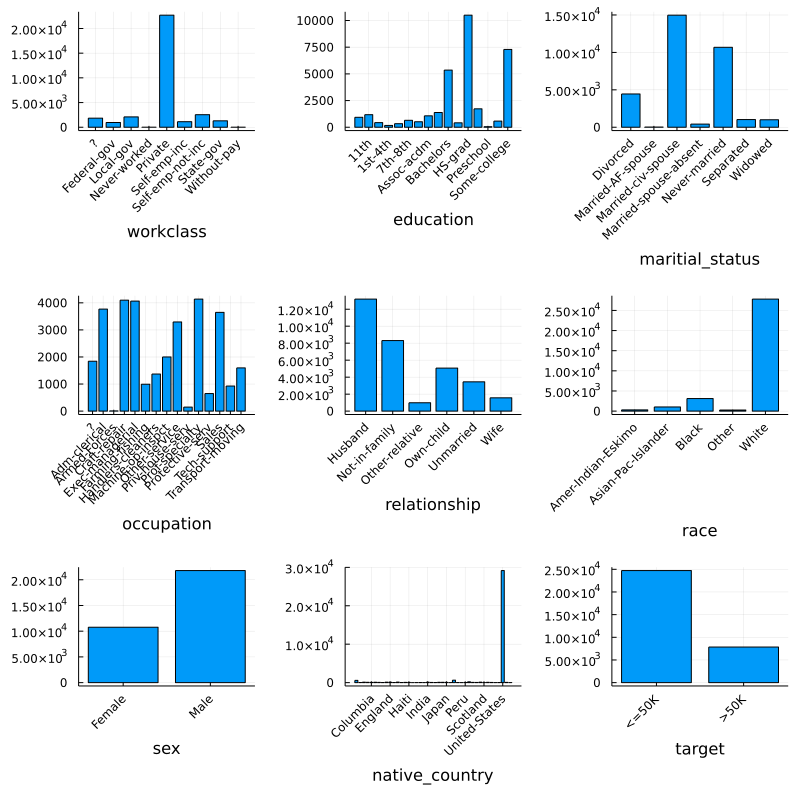

In [12]:
function bar_helper(column_name)
    agg = combine(groupby(df, column_name, sort=true), nrow => :count)
    bar(string.(agg[!, column_name]), agg[!,:count], xlabel=column_name,legend=false, xrotation = 45)
    end;
plot(map(x -> bar_helper(x), nominal)..., layout=grid(3, 3),size=(800,800))

<b> 9. Collapse classes in native_country to United-States and not-United-States. Check the resulting distribution of the variable. Such transformations to collapse several levels into one in the features are quite common in practice.</b>

In [13]:
transform!(df,:native_country => ByRow(x -> if lstrip(x)=="United-States" "United-States" else "not-United-States" end),renamecols=false);

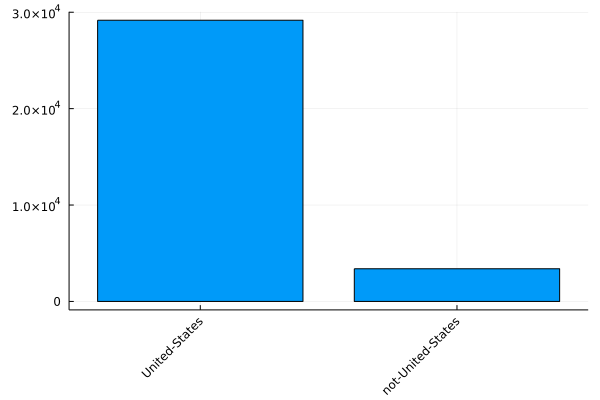

In [14]:
bar_helper(:native_country)

<b>10. Create a two-way table for maritial_status and relationship to check how closely they are related and whether they are consistent. You should receive table similar to the one below.</b>

In [15]:
@chain df begin
    groupby([:maritial_status, :relationship])
    combine(nrow)
    unstack(:maritial_status, :relationship, :nrow)
end

,maritial_status,Not-in-family,Husband,Wife,Own-child,Unmarried,Other-relative
,String31,Int64?,Int64?,Int64?,Int64?,Int64?,Int64?
1,Never-married,4706,missing,missing,4485,881,611
2,Married-civ-spouse,17,13184,1556,95,missing,124
3,Divorced,2404,missing,missing,328,1601,110
4,Married-spouse-absent,211,missing,missing,45,130,32
5,Separated,420,missing,missing,99,451,55
6,Married-AF-spouse,missing,9,12,1,missing,1
7,Widowed,547,missing,missing,15,383,48


<b>11. Prepare histograms of all the continuous variables in the dataset. Analyze the distribution of capital_gain. What conclusions can be drawn? (As in the case of missing values, we do not transform this variable, since it should be possible to handle it as-is in the machine learning models we plan to use.)</b>

In [16]:
hist_helper(colname)=
    histogram(df[!,colname],legend=false,xlabel=colname)
continuous=names(df,Int64)
l = @layout [ a b ; c d ; e _ ]
plot(map(x -> hist_helper(x), continuous)..., layout=l,size=(800,800))

<b>12. For the :capital_gain and :capital_loss variables, calculate the probability of 0.</b>

In [17]:
count(df.capital_loss .== 0)/(count(df.capital_loss .== 0)+count(df.capital_loss .!= 0))

0.9533490986149074

In [18]:
count(df.capital_gain .== 0)/(count(df.capital_gain .== 0)+count(df.capital_gain .!= 0))

0.9167101747489328

<b>13. Calculate the probability of :capital_gain and :capital_loss equal to 0 conditional on the value of :target. What conclusions can be drawn? You should receive results similar to as depicted below.</b>

In [19]:
@chain df begin
    groupby(:target)
    combine([:capital_gain, :capital_loss] .=>
            (x -> count(x.==0)/(count(x.==0)+count(x.!=0))) .=>
            [:freq0_capital_gain, :freq0_capital_loss])
end

,target,freq0_capital_gain,freq0_capital_loss
,String7,Float64,Float64
1,<=50K,0.958131,0.969822
2,>50K,0.786124,0.901416


<b>14. Save the final dataset in Apache Arrow format. We’ll use it in further Projects.</b>

In [20]:
Arrow.write("adult.arrow", df)

"adult.arrow"